In [1]:
import glob
import pandas as pd
import math
import os
import numpy as np
import tensorflow as tf
import seaborn as sns 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Dense,Dropout
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.model_selection import StratifiedKFold
from enum import Enum

class Device(Enum):
   Danmini_Doorbell = 1
   Ecobee_Thermostat = 2
   Ennio_Doorbell = 3
   Philips_B120N10_Baby_Monitor = 4
   Provision_PT_737E_Security_Camera = 5
   Provision_PT_838_Security_Camera = 6
   Samsung_SNH_1011_N_Webcam = 7
   SimpleHome_XCS7_1002_WHT_Security_Camera = 8
   SimpleHome_XCS7_1003_WHT_Security_Camera = 9

class Attack(Enum):
   benign_traffic = 1
   gafgyt_combo = 2
   gafgyt_junk = 3
   gafgyt_scan = 4
   gafgyt_tcp = 5
   gafgyt_udp = 6
   mirai_ack = 7
   mirai_scan = 8
   mirai_syn = 9
   mirai_udp = 10
   mirai_udpplain = 11




#Lettura del dataset dai csv da far diventare una funzione
#os.chdir('./Kitsune-Testa')
dataset = dict()
dataset_path = "./Dataset/"
csv_paths = glob.glob(dataset_path+'**/*.csv', recursive = True)
for csv_path in csv_paths:
   print(csv_path)
   attack = ''
   device = csv_path.split('\\')[1]
   if device not in dataset:
      dataset[device] = {}
   if( len(csv_path.split('\\')) == 4):
      attack = csv_path.split('\\')[2]+'_'+csv_path.split('\\')[3]
   else:
      attack = csv_path.split('\\')[2]
   attack = attack.replace(".csv","")
   print(attack)
   dataset[device][attack] = pd.read_csv(csv_path, delimiter = ',')
   dataset[device][attack]['Attack'],dataset[device][attack]['Device'] = [Attack[attack].value,Device[device].value]

#Conversione dataset Danmini da Dataframe a numpy, creazione dataset benigno, maligno e misto
danmini_dataset = dataset['Danmini_Doorbell']
danmini_benign = danmini_dataset['benign_traffic']
danmini_benign = pd.concat([danmini_benign], ignore_index=True)

./Dataset\Danmini_Doorbell\benign_traffic.csv
benign_traffic
./Dataset\Danmini_Doorbell\gafgyt\combo.csv
gafgyt_combo
./Dataset\Danmini_Doorbell\gafgyt\junk.csv
gafgyt_junk
./Dataset\Danmini_Doorbell\gafgyt\scan.csv
gafgyt_scan
./Dataset\Danmini_Doorbell\gafgyt\tcp.csv
gafgyt_tcp
./Dataset\Danmini_Doorbell\gafgyt\udp.csv
gafgyt_udp
./Dataset\Danmini_Doorbell\mirai\ack.csv
mirai_ack
./Dataset\Danmini_Doorbell\mirai\scan.csv
mirai_scan
./Dataset\Danmini_Doorbell\mirai\syn.csv
mirai_syn
./Dataset\Danmini_Doorbell\mirai\udp.csv
mirai_udp
./Dataset\Danmini_Doorbell\mirai\udpplain.csv
mirai_udpplain
./Dataset\Ecobee_Thermostat\benign_traffic.csv
benign_traffic
./Dataset\Ecobee_Thermostat\gafgyt\combo.csv
gafgyt_combo
./Dataset\Ecobee_Thermostat\gafgyt\junk.csv
gafgyt_junk
./Dataset\Ecobee_Thermostat\gafgyt\scan.csv
gafgyt_scan
./Dataset\Ecobee_Thermostat\gafgyt\tcp.csv
gafgyt_tcp
./Dataset\Ecobee_Thermostat\gafgyt\udp.csv
gafgyt_udp
./Dataset\Ecobee_Thermostat\mirai\ack.csv
mirai_ack
./Datas

<AxesSubplot:>

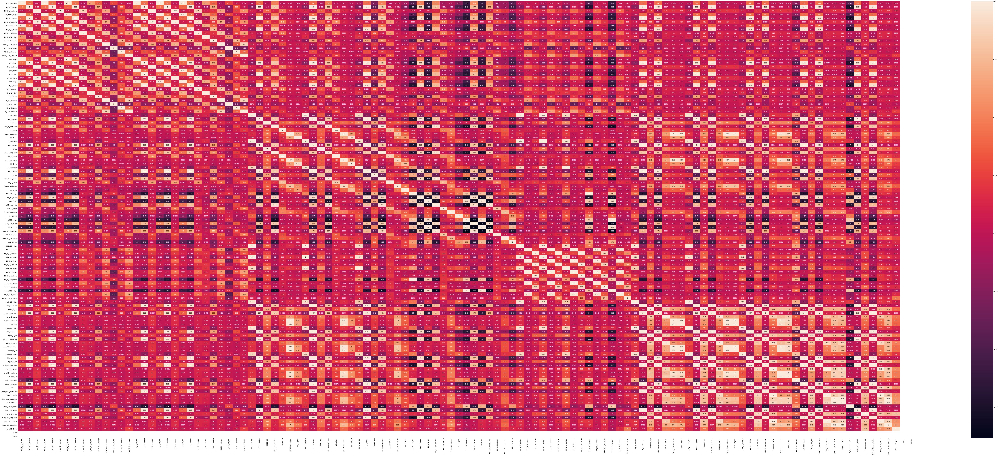

In [3]:
plt.figure(figsize = (150,60))
sns.heatmap( danmini_benign.corr(), annot=True)

In [4]:
import pandas as pd
import numpy as np
from pyts.multivariate.image import JointRecurrencePlot
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from matplotlib.colors import SymLogNorm
import os

os.getcwd()
os.chdir('./Dataset/Danmini_Doorbell')
df=pd.read_csv('benign_traffic.csv')

m=df.values[:2048,:]
m=MinMaxScaler().fit_transform(m)
m=m.T
m=np.array([m])

i=JointRecurrencePlot(threshold='distance').fit_transform(m)

plt.figure(figsize=(5,5))
plt.imshow(i[0],norm=SymLogNorm(linthresh=1e-3,vmin=0,vmax=1))
plt.colorbar()
plt.tight_layout()
plt.show()

FileNotFoundError: [WinError 3] Impossibile trovare il percorso specificato: './Dataset/Danmini_Doorbell'